In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date
from datetime import datetime
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder #preprocessing
from sklearn.compose import ColumnTransformer #preprocessing
from sklearn.model_selection import train_test_split, GridSearchCV #data split, grid search
from imblearn.over_sampling import SMOTE #balance classes
from sklearn.linear_model import LogisticRegression, LinearRegression 
from sklearn.svm import SVC, SVR #support vector machine
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor #knn
from sklearn.naive_bayes import GaussianNB #bayes
from xgboost import XGBClassifier, XGBRegressor, XGBRFRegressor #gradient boosting tree
from sklearn.metrics import accuracy_score, recall_score, mean_squared_error, r2_score #calculates accuracy, recall
from sklearn.ensemble import VotingClassifier, VotingRegressor #ensemble

# New Section

In [2]:
pd.set_option('display.max_columns', None)
customer_data = pd.read_csv('marketing_campaign.csv',delimiter=';', index_col='ID')
customer_data.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
ID,,,,,,,,,,,,,,,,,,,,,,,,,,,,
5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [3]:
customer_data['Age'] = customer_data.Year_Birth.apply(lambda x: date.today().year  - int(x))

customer_data['Dt_Customer'] = pd.to_datetime(customer_data.Dt_Customer)
now = datetime.now()
customer_data['Days_Since_Customer'] = customer_data.Dt_Customer.apply(lambda x: (now - x).total_seconds()/ (60 * 60 * 24))

customer_data['Num_Accepted'] = customer_data.AcceptedCmp1.values + customer_data.AcceptedCmp2.values + customer_data.AcceptedCmp3.values + customer_data.AcceptedCmp4.values + customer_data.AcceptedCmp5.values

education_map = { 'Graduation':16, 'PhD':21, '2n Cycle' : 12, 'Master':18, 'Basic':6}
customer_data['Edu_years'] = customer_data.Education.map(education_map)

customer_data['CampaignsCntToGetAccepted'] = 0
for idx, row in customer_data.iterrows():
  try:
    res = [row.AcceptedCmp1, row.AcceptedCmp2, row.AcceptedCmp3, row.AcceptedCmp4, row.AcceptedCmp5, row.Response].index(1) + 1
  except(ValueError):
    res = 0
  customer_data['CampaignsCntToGetAccepted'][idx] = res


marital_map = {'Absurd': 1, 'Alone': 1, 'YOLO': 1, 'Single': 1, 'Married': 2, 'Together': 2, 'Widow': 1, 'Divorced': 1}
customer_data['Marital_Status'] = customer_data.Marital_Status.map(marital_map)
customer_data['Num_Kids'] = customer_data.Kidhome.values + customer_data.Teenhome.values
customer_data['Fam_Size'] = customer_data.Marital_Status.values + customer_data.Num_Kids.values

customer_data['MntTotal'] = customer_data['MntWines'].values + customer_data['MntFruits'].values + \
                            customer_data['MntMeatProducts'].values + customer_data['MntFishProducts'].values + \
                            customer_data['MntWines'].values + customer_data['MntSweetProducts'].values + \
                            customer_data['MntGoldProds'].values


customer_data.drop(['Dt_Customer', 'Year_Birth', 'AcceptedCmp2',
                    'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Kidhome', 'Teenhome',
                   'Z_CostContact', 'Z_Revenue', 'Num_Kids', 'Marital_Status'],
                   axis=1, inplace=True)
customer_data.tail() 


<ipython-input-3-3154bcc5313d>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  customer_data['CampaignsCntToGetAccepted'][idx] = res


,Education,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp1,Complain,Response,Age,Days_Since_Customer,Num_Accepted,Edu_years,CampaignsCntToGetAccepted,Fam_Size,MntTotal
ID,,,,,,,,,,,,,,,,,,,,,,,,
10870,Graduation,61223.0,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,55,3462.03413,0,16,0,3,2050
4001,PhD,64014.0,56,406,0,30,0,0,8,7,8,2,5,7,1,0,0,76,3100.03413,1,21,1,5,850
7270,Graduation,56981.0,91,908,48,217,32,12,24,1,2,3,13,6,0,0,0,41,3236.03413,1,16,4,1,2149
8235,Master,69245.0,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,66,3237.03413,0,18,0,3,1271
9405,PhD,52869.0,40,84,3,61,2,1,21,3,3,1,4,7,0,0,1,68,3703.03413,0,21,6,4,256


In [4]:
customer_data.head()

,Education,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp1,Complain,Response,Age,Days_Since_Customer,Num_Accepted,Edu_years,CampaignsCntToGetAccepted,Fam_Size,MntTotal
ID,,,,,,,,,,,,,,,,,,,,,,,,
5524,Graduation,58138.0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,1,65,3744.03413,0,16,6,1,2252
2174,Graduation,46344.0,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,68,3194.03413,0,16,0,3,38
4141,Graduation,71613.0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,57,3393.03413,0,16,0,2,1202
6182,Graduation,26646.0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,38,3220.03413,0,16,0,3,64
5324,PhD,58293.0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,41,3242.03413,0,21,0,3,595


In [5]:
print('Dataset Shape:', customer_data.shape)
print('Total Nulls Per Column:')
print(customer_data.isnull().sum())

Dataset Shape: (2240, 24)
Total Nulls Per Column:
Education                     0
Income                       24
Recency                       0
MntWines                      0
MntFruits                     0
MntMeatProducts               0
MntFishProducts               0
MntSweetProducts              0
MntGoldProds                  0
NumDealsPurchases             0
NumWebPurchases               0
NumCatalogPurchases           0
NumStorePurchases             0
NumWebVisitsMonth             0
AcceptedCmp1                  0
Complain                      0
Response                      0
Age                           0
Days_Since_Customer           0
Num_Accepted                  0
Edu_years                     0
CampaignsCntToGetAccepted     0
Fam_Size                      0
MntTotal                      0
dtype: int64


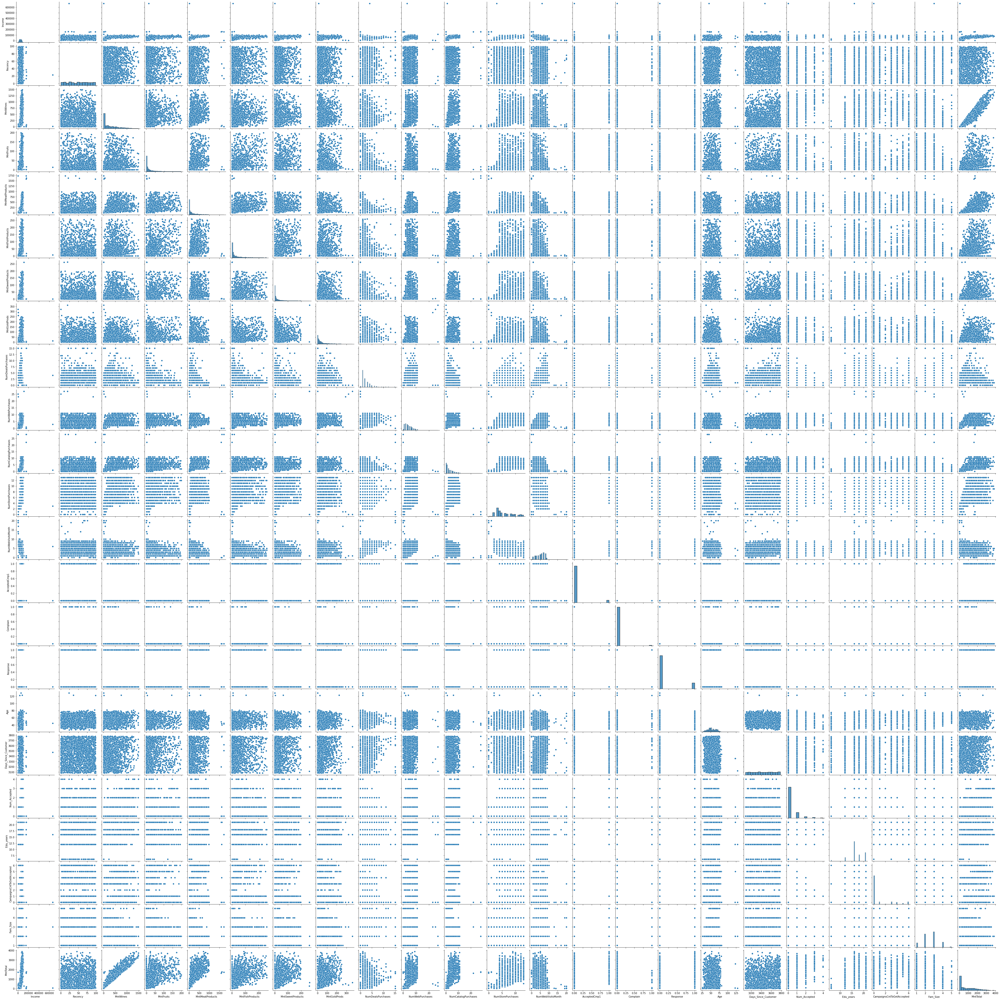

In [6]:
sns.pairplot(data = customer_data)


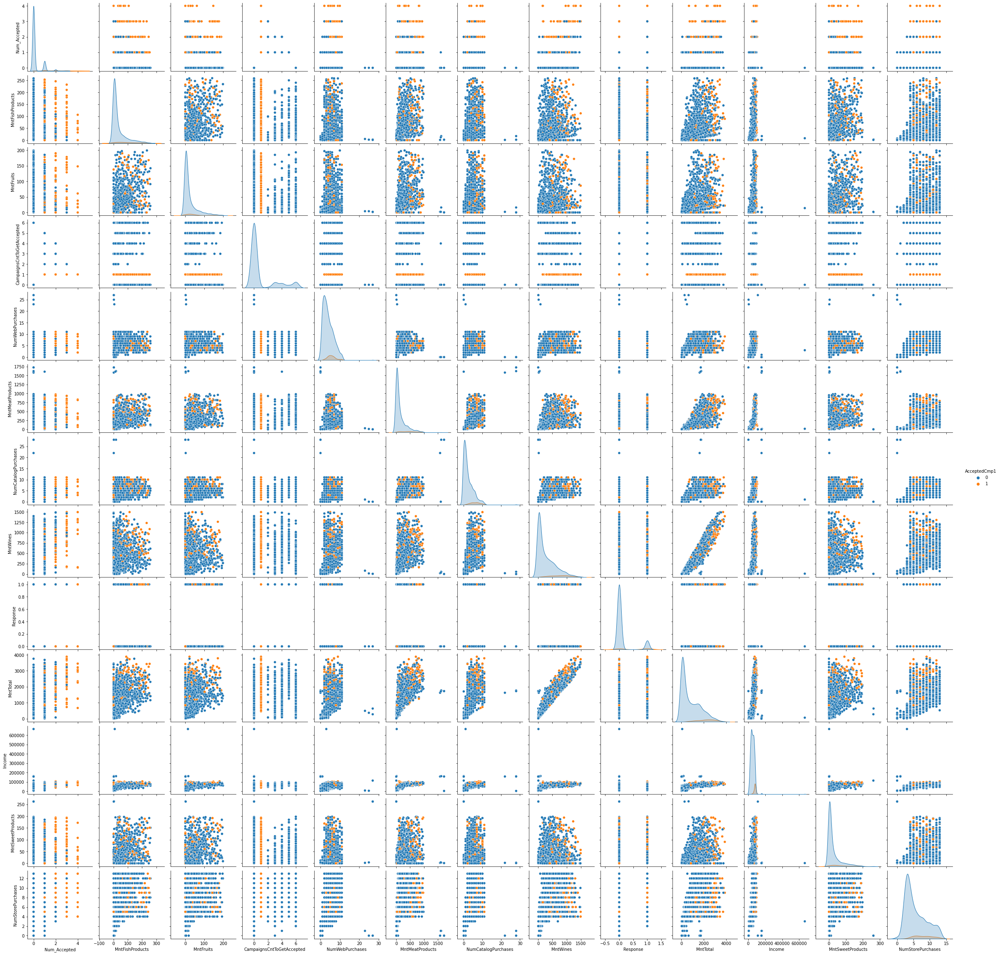

In [7]:
sns.pairplot(data = customer_data[['Num_Accepted',
 'MntFishProducts',
 'MntFruits',
 'CampaignsCntToGetAccepted',
 'NumWebPurchases',
 'MntMeatProducts',
 'NumCatalogPurchases',
 'MntWines',
 'Response',
 'MntTotal',
 'Income',
 'MntSweetProducts',
 'AcceptedCmp1',
 'NumStorePurchases']],hue='AcceptedCmp1')

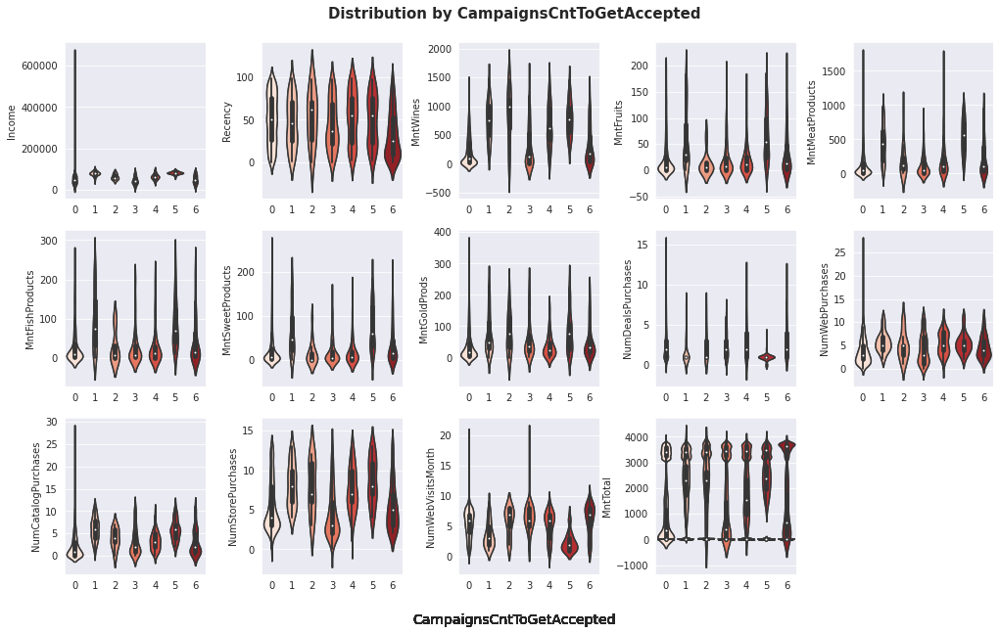

In [8]:
def num_feat_plot(df, feat_nlist, target, feat_clist = None):
    
    sns.set_style("darkgrid")    
    fig = plt.figure()
    fig.subplots_adjust(hspace=0.2, wspace=0.4)
    i=1
    feat_nl = feat_nlist.copy()
 
    
    for feat in feat_nl:
        sns.violinplot(data = df, y = feat, x = target)
        ax=sns.violinplot(data = df, y = feat, x = target, palette="Reds")
        ax.set_xlabel("", size = 10)
        
        if i<15:
            plt.subplot(3, 5, i)
            i+=1
        
        fig.suptitle('Distribution by CampaignsCntToGetAccepted', ha='center',
                     va='center', fontsize=15, y=0.92, fontweight='bold')
        fig.text(0.5, 0.06, 'CampaignsCntToGetAccepted', ha='center', va='center', fontsize=14)
        fig.set_figheight(10)
        fig.set_figwidth(17)

    return
feat_n_ = customer_data.drop("CampaignsCntToGetAccepted", axis = 1).columns
num_feat_plot(customer_data, feat_n_, "CampaignsCntToGetAccepted")

In [9]:
imputer = SimpleImputer(strategy='mean')
imputer.fit(customer_data.Income.values.reshape(-1,1))
customer_data['Income'] = imputer.transform(customer_data.Income.values.reshape(-1,1))

In [10]:
pos_resp = customer_data.Response.sum()
total = customer_data.shape[0]
percent = round((pos_resp / total)*100, 2)
print(pos_resp, 'customers responded to the marketing campaign out of a total of', total, 'cutomers.')
print('Percent Responded: ' +  str(percent) + '%')

334 customers responded to the marketing campaign out of a total of 2240 cutomers.
Percent Responded: 14.91%


In [11]:
pos_resp_camp1 = customer_data.AcceptedCmp1.sum()
total = customer_data.shape[0]
percent = round((pos_resp_camp1 / total)*100, 2)
print(pos_resp_camp1, 'customers responded to the marketing campaign 1 out of a total of', total, 'cutomers.')
print('Percent Responded: ' +  str(percent) + '%')

144 customers responded to the marketing campaign 1 out of a total of 2240 cutomers.
Percent Responded: 6.43%


In [12]:
response_corr_abs = np.abs(customer_data.corr()['Response']).sort_values(ascending=False)[1:]
response_corr = customer_data.corr()['Response'].sort_values(ascending=False)[1:]
print("Correlation Coefficients for 'Response'")
print('--------------------------------------------------------')
print(response_corr)

Correlation Coefficients for 'Response'
--------------------------------------------------------
CampaignsCntToGetAccepted    0.682487
Num_Accepted                 0.426035
AcceptedCmp1                 0.293982
MntTotal                     0.265518
MntWines                     0.247254
MntMeatProducts              0.236335
NumCatalogPurchases          0.220810
Days_Since_Customer          0.194481
NumWebPurchases              0.148730
MntGoldProds                 0.139850
Income                       0.132756
MntFruits                    0.125289
MntSweetProducts             0.117372
MntFishProducts              0.111331
Edu_years                    0.098674
NumStorePurchases            0.039363
NumDealsPurchases            0.002238
Complain                    -0.001707
NumWebVisitsMonth           -0.003987
Age                         -0.021325
Recency                     -0.198437
Fam_Size                    -0.219440
Name: Response, dtype: float64


In [13]:
response1_corr_abs = np.abs(customer_data.corr()['AcceptedCmp1']).sort_values(ascending=False)[1:]
response1_corr = customer_data.corr()['AcceptedCmp1'].sort_values(ascending=False)[1:]
print("Correlation Coefficients for 'AcceptedCmp1'")
print('--------------------------------------------------------')
print(response1_corr)

Correlation Coefficients for 'AcceptedCmp1'
--------------------------------------------------------
Num_Accepted                 0.679322
MntTotal                     0.381309
MntWines                     0.354133
MntMeatProducts              0.309761
NumCatalogPurchases          0.308097
Response                     0.293982
Income                       0.274921
MntFishProducts              0.260762
MntSweetProducts             0.241818
MntFruits                    0.194748
NumStorePurchases            0.183249
MntGoldProds                 0.166396
NumWebPurchases              0.155143
Edu_years                    0.007842
Age                          0.005930
CampaignsCntToGetAccepted    0.003396
Recency                     -0.019283
Complain                    -0.025499
Days_Since_Customer         -0.039569
NumDealsPurchases           -0.123244
Fam_Size                    -0.182056
NumWebVisitsMonth           -0.192502
Name: AcceptedCmp1, dtype: float64


In [14]:
def display_kdeplot(df, col1, col2):
    plt.figure(figsize=(8,8))
    sns.kdeplot(data=df, x=col1, hue=col2, multiple="stack")
    plt.title(col1 + ' correlation with ' + col2)
    plt.legend(['AcceptedCmp1', 'No AcceptedCmp1'])
    plt.show()
    print(df[col1].describe())

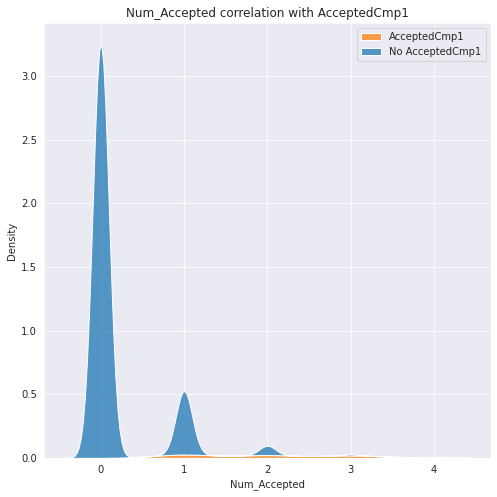

count    2240.000000
mean        0.297768
std         0.678381
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         4.000000
Name: Num_Accepted, dtype: float64
Correlation %: 67.93
------------------------------------------------------------------------


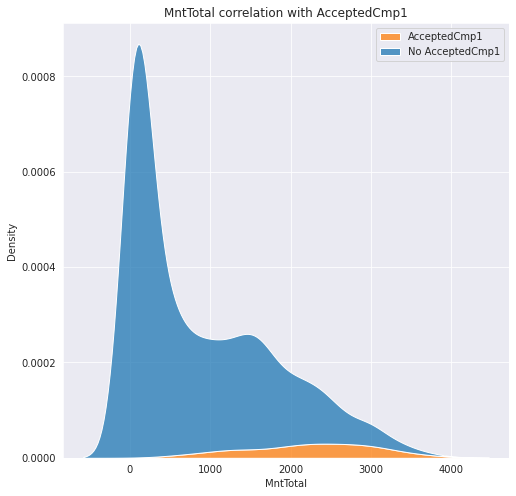

count    2240.000000
mean      909.733929
std       915.194547
min         7.000000
25%        90.750000
50%       579.500000
75%      1546.500000
max      3880.000000
Name: MntTotal, dtype: float64
Correlation %: 38.13
------------------------------------------------------------------------


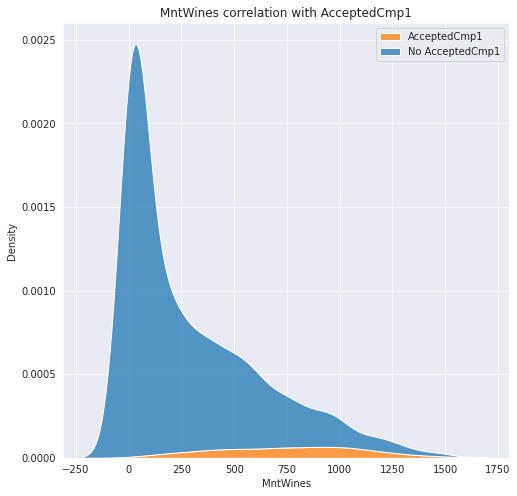

count    2240.000000
mean      303.935714
std       336.597393
min         0.000000
25%        23.750000
50%       173.500000
75%       504.250000
max      1493.000000
Name: MntWines, dtype: float64
Correlation %: 35.41
------------------------------------------------------------------------


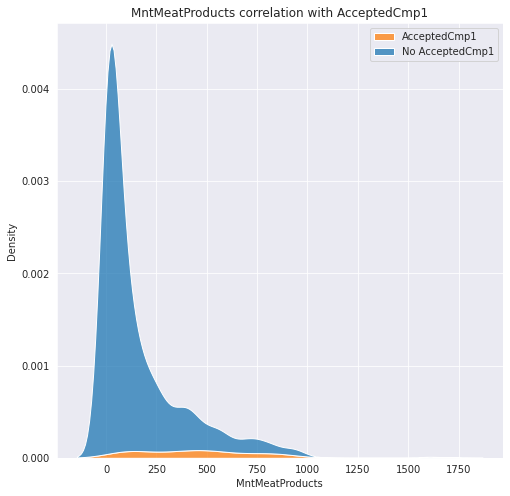

count    2240.000000
mean      166.950000
std       225.715373
min         0.000000
25%        16.000000
50%        67.000000
75%       232.000000
max      1725.000000
Name: MntMeatProducts, dtype: float64
Correlation %: 30.98
------------------------------------------------------------------------


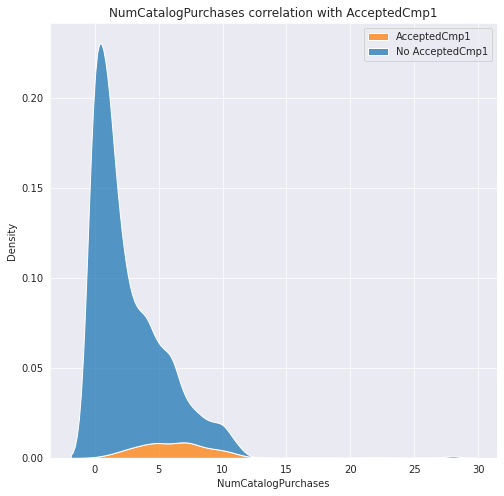

count    2240.000000
mean        2.662054
std         2.923101
min         0.000000
25%         0.000000
50%         2.000000
75%         4.000000
max        28.000000
Name: NumCatalogPurchases, dtype: float64
Correlation %: 30.81
------------------------------------------------------------------------


In [15]:
for i in range(5):
    feature_name = response1_corr_abs.index[i]
    display_kdeplot(customer_data, feature_name, 'AcceptedCmp1')
    print('Correlation %:', round(response1_corr[feature_name] * 100, 2))
    print('------------------------------------------------------------------------')

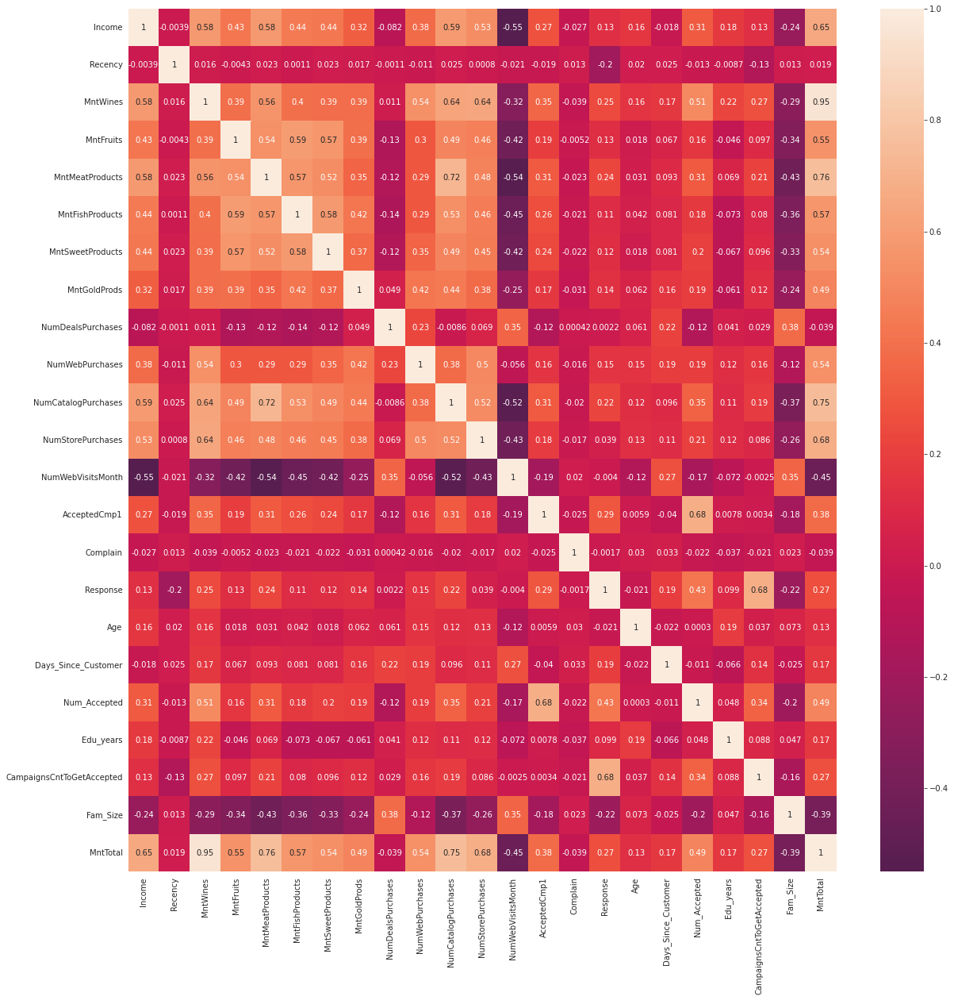

In [16]:
plt.figure(figsize=(20,20))
cmap = sns.color_palette("rocket", as_cmap=True)
sns.heatmap(customer_data.corr(), annot=True, cmap=cmap, center=0)

In [17]:
def display_scatterplot(df, col1, col2):
    plt.figure(figsize=(8,8))
    sns.scatterplot(data=df, x=col1, y=col2, hue='AcceptedCmp1')
    plt.title(col1 + ' correlation with ' + col2)
    plt.legend(['AcceptedCmp1', 'No AcceptedCmp1'])
    plt.show()

In [18]:
corr = customer_data.corr()


c = []
for rowidx in corr.index:
  for col in corr.columns:
    if (corr[rowidx][col]) >= 0.5  and corr[rowidx][col] < 1 and [rowidx,col] not in c  and [col,rowidx] not in c:
      c.append([rowidx,col])
c.sort()
print(c)

[['AcceptedCmp1', 'Num_Accepted'], ['Income', 'MntMeatProducts'], ['Income', 'MntTotal'], ['Income', 'MntWines'], ['Income', 'NumCatalogPurchases'], ['Income', 'NumStorePurchases'], ['MntFishProducts', 'MntSweetProducts'], ['MntFishProducts', 'MntTotal'], ['MntFishProducts', 'NumCatalogPurchases'], ['MntFruits', 'MntFishProducts'], ['MntFruits', 'MntMeatProducts'], ['MntFruits', 'MntSweetProducts'], ['MntFruits', 'MntTotal'], ['MntMeatProducts', 'MntFishProducts'], ['MntMeatProducts', 'MntSweetProducts'], ['MntMeatProducts', 'MntTotal'], ['MntMeatProducts', 'NumCatalogPurchases'], ['MntSweetProducts', 'MntTotal'], ['MntWines', 'MntMeatProducts'], ['MntWines', 'MntTotal'], ['MntWines', 'NumCatalogPurchases'], ['MntWines', 'NumStorePurchases'], ['MntWines', 'NumWebPurchases'], ['MntWines', 'Num_Accepted'], ['NumCatalogPurchases', 'MntTotal'], ['NumCatalogPurchases', 'NumStorePurchases'], ['NumStorePurchases', 'MntTotal'], ['NumWebPurchases', 'MntTotal'], ['NumWebPurchases', 'NumStorePurc

In [19]:
pd.options.display.float_format='{:.2f}'.format
customer_data[['Income','Age','MntTotal','Fam_Size','Edu_years']].describe()

,Income,Age,MntTotal,Fam_Size,Edu_years
count,2240.00,2240.00,2240.00,2240.00,2240.00
mean,52247.25,53.19,909.73,2.60,16.81
std,25037.80,11.98,915.19,0.91,3.05
min,1730.00,26.00,7.00,1.00,6.00
25%,35538.75,45.00,90.75,2.00,16.00
50%,51741.50,52.00,579.50,3.00,16.00
75%,68289.75,63.00,1546.50,3.00,18.00
max,666666.00,129.00,3880.00,5.00,21.00


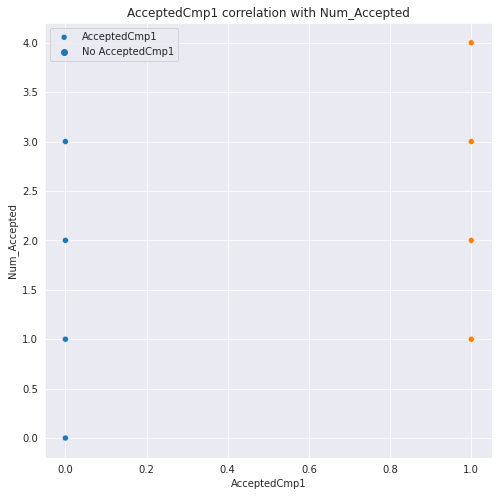

Correlation Coefficient %: 0.68
-----------------------------------------------------------


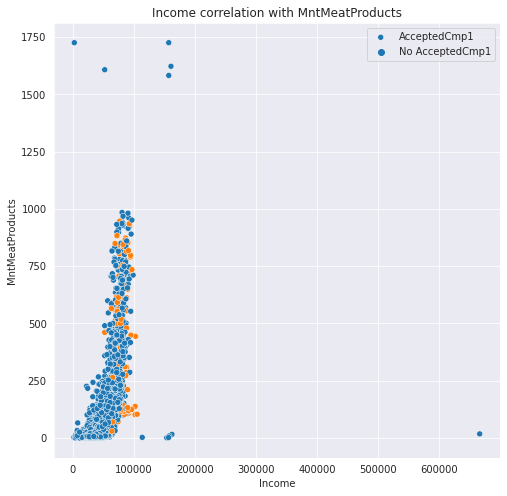

Correlation Coefficient %: 0.58
-----------------------------------------------------------


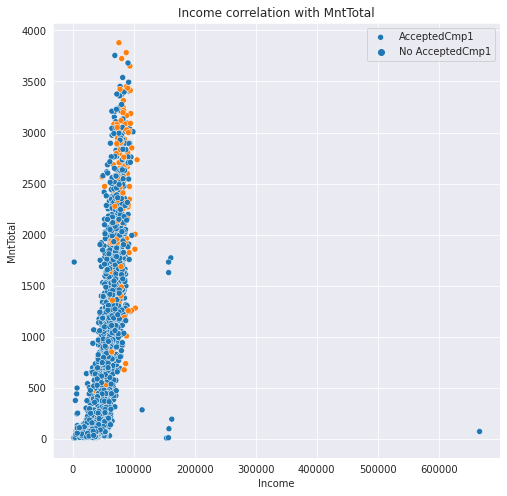

Correlation Coefficient %: 0.65
-----------------------------------------------------------


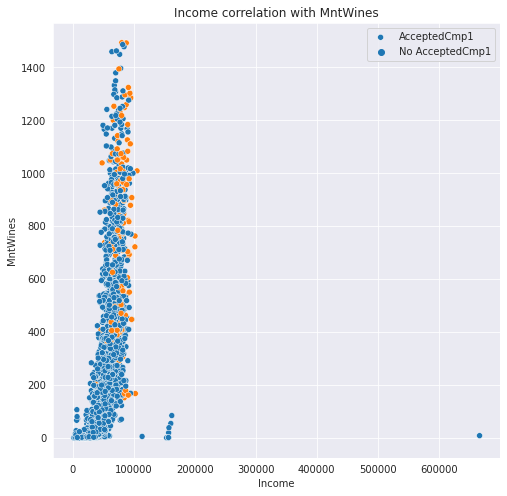

Correlation Coefficient %: 0.58
-----------------------------------------------------------


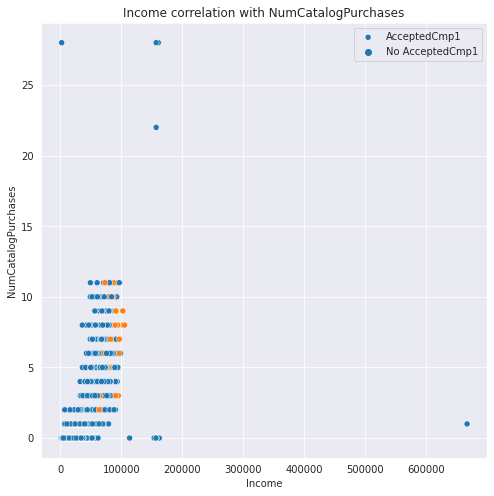

Correlation Coefficient %: 0.59
-----------------------------------------------------------


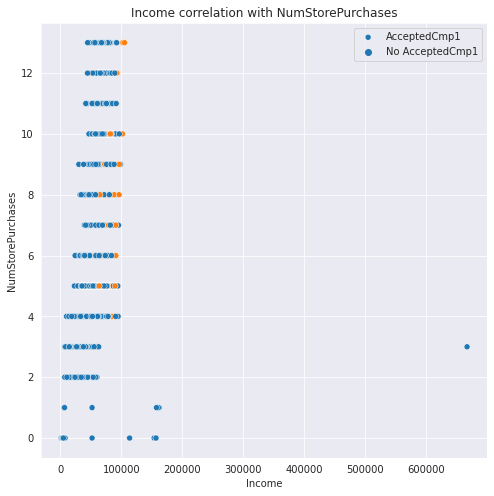

Correlation Coefficient %: 0.53
-----------------------------------------------------------


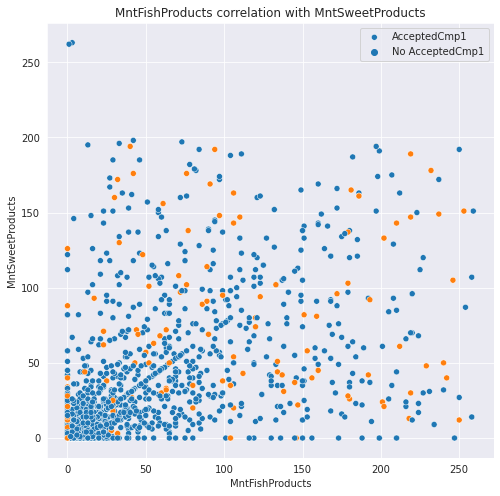

Correlation Coefficient %: 0.58
-----------------------------------------------------------


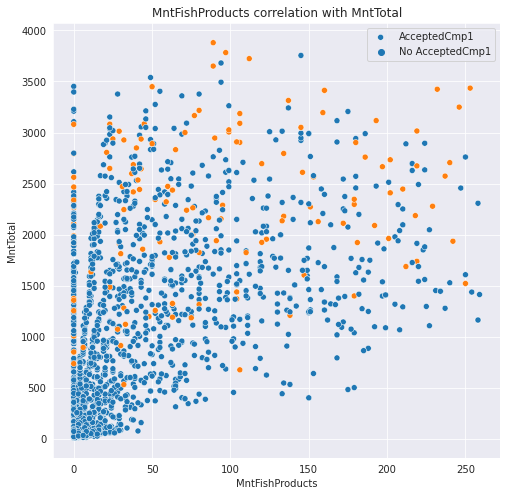

Correlation Coefficient %: 0.57
-----------------------------------------------------------


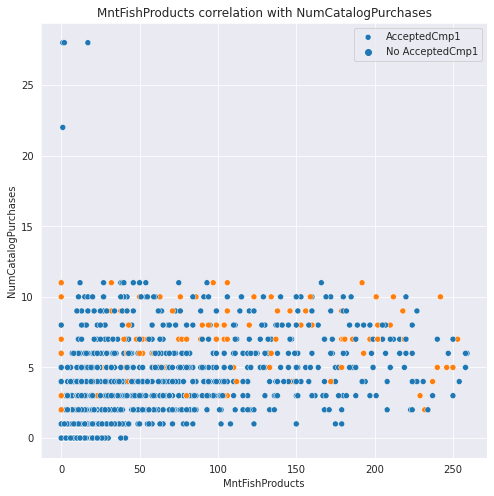

Correlation Coefficient %: 0.53
-----------------------------------------------------------


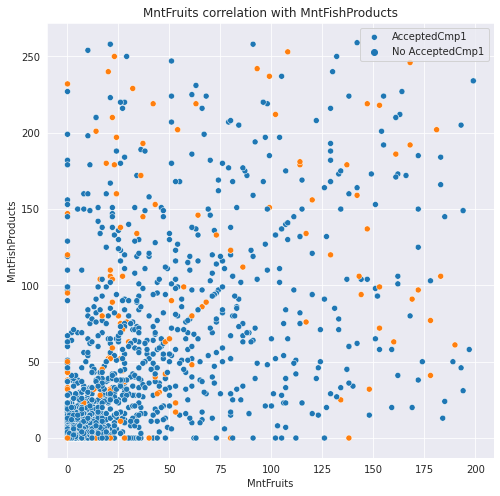

Correlation Coefficient %: 0.59
-----------------------------------------------------------


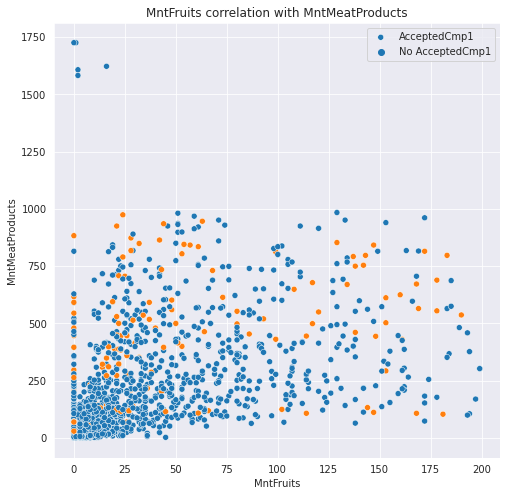

Correlation Coefficient %: 0.54
-----------------------------------------------------------


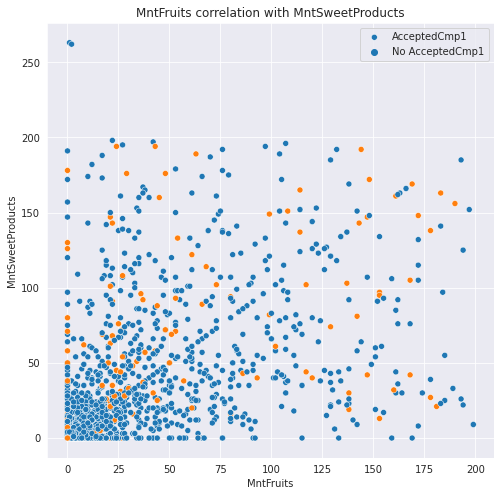

Correlation Coefficient %: 0.57
-----------------------------------------------------------


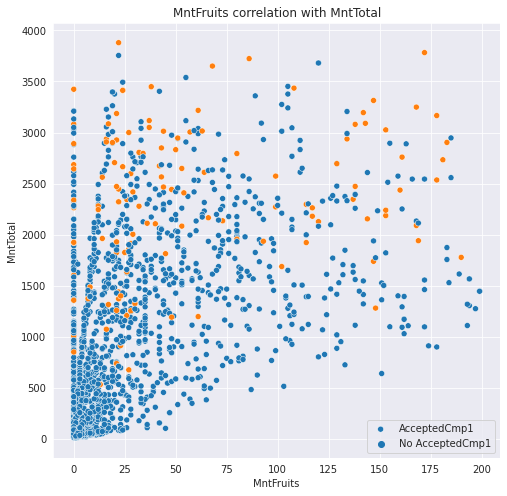

Correlation Coefficient %: 0.55
-----------------------------------------------------------


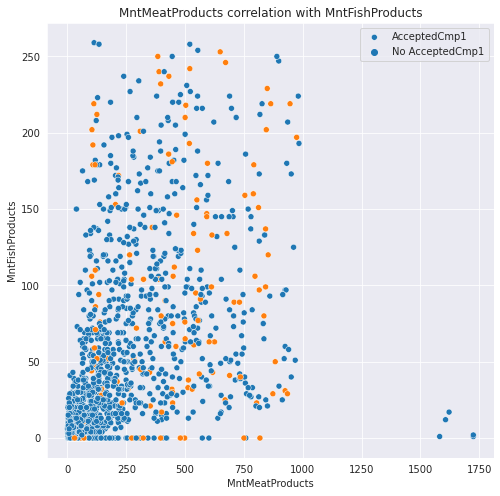

Correlation Coefficient %: 0.57
-----------------------------------------------------------


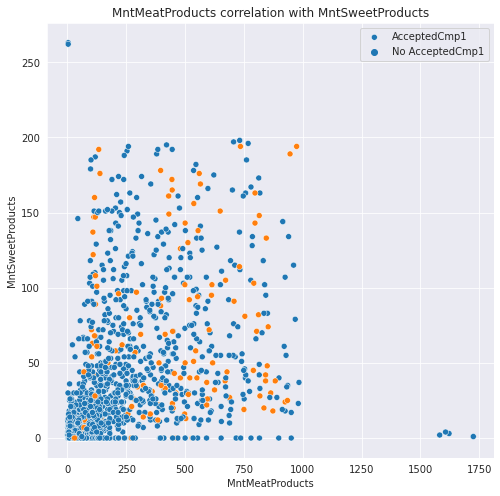

Correlation Coefficient %: 0.52
-----------------------------------------------------------


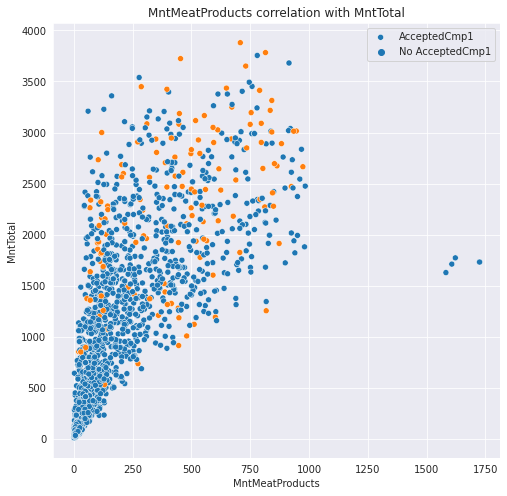

Correlation Coefficient %: 0.76
-----------------------------------------------------------


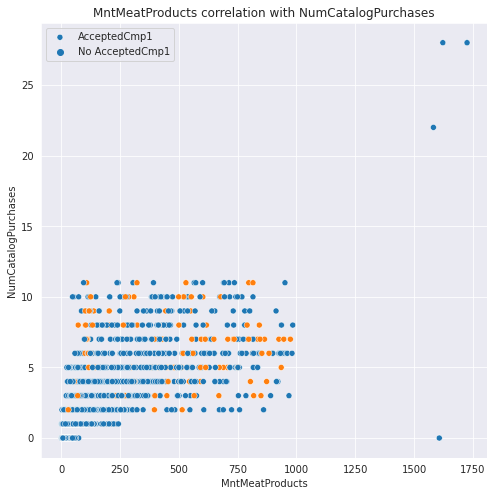

Correlation Coefficient %: 0.72
-----------------------------------------------------------


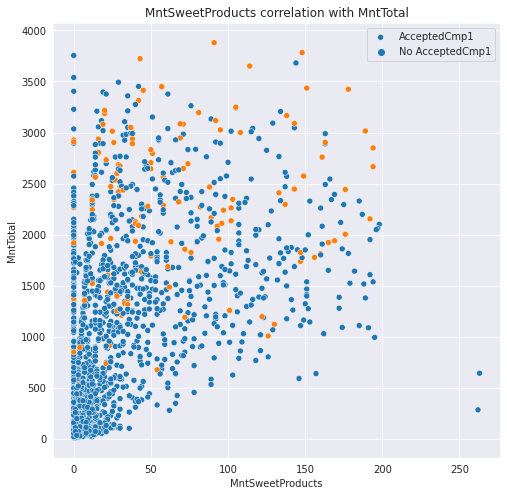

Correlation Coefficient %: 0.54
-----------------------------------------------------------


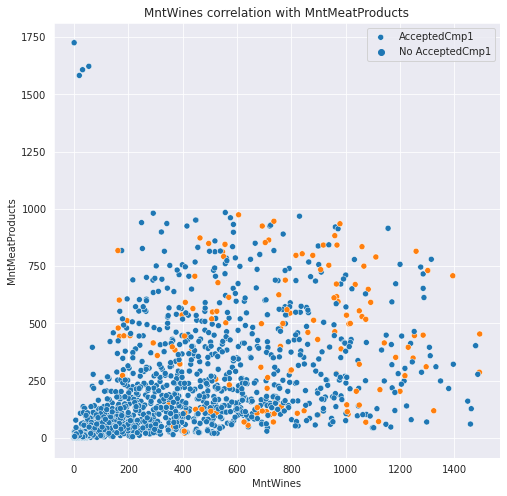

Correlation Coefficient %: 0.56
-----------------------------------------------------------


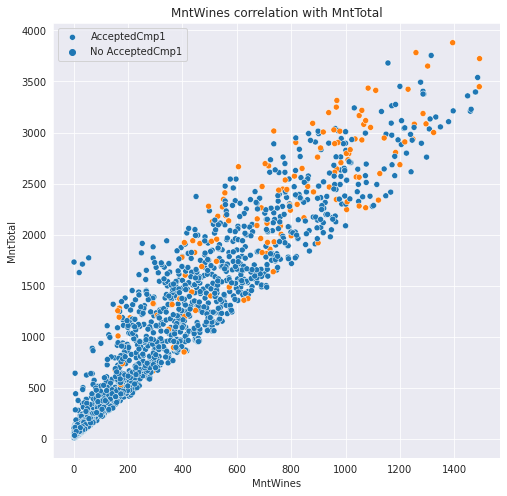

Correlation Coefficient %: 0.95
-----------------------------------------------------------


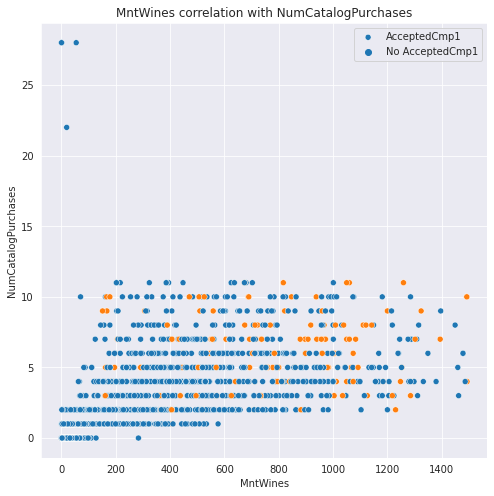

Correlation Coefficient %: 0.64
-----------------------------------------------------------


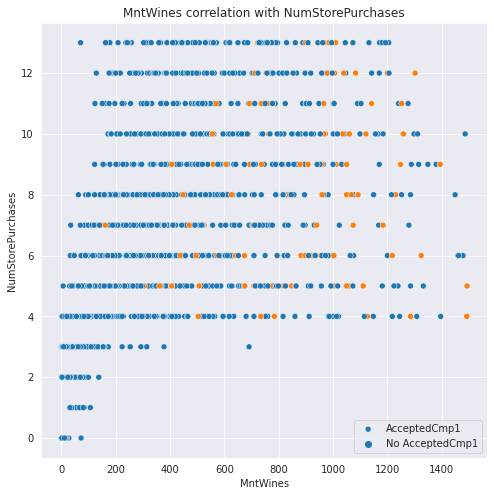

Correlation Coefficient %: 0.64
-----------------------------------------------------------


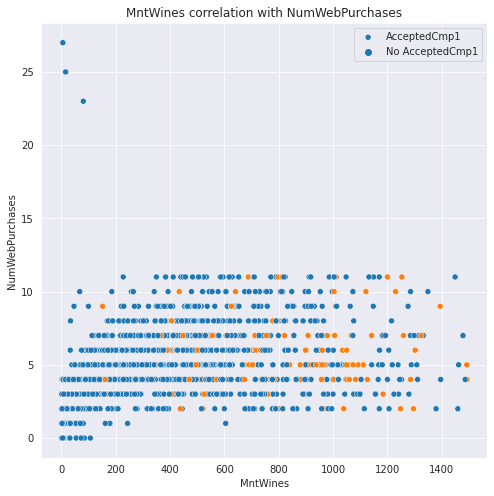

Correlation Coefficient %: 0.54
-----------------------------------------------------------


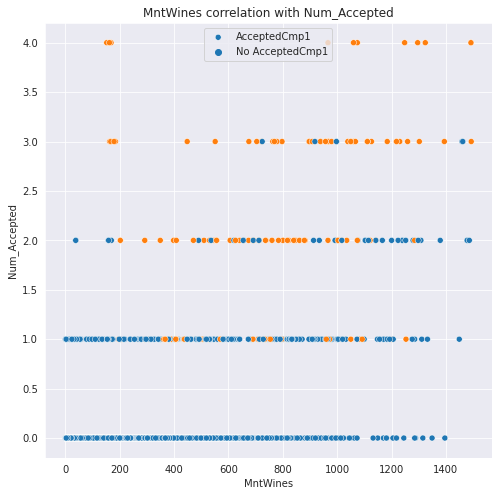

Correlation Coefficient %: 0.51
-----------------------------------------------------------


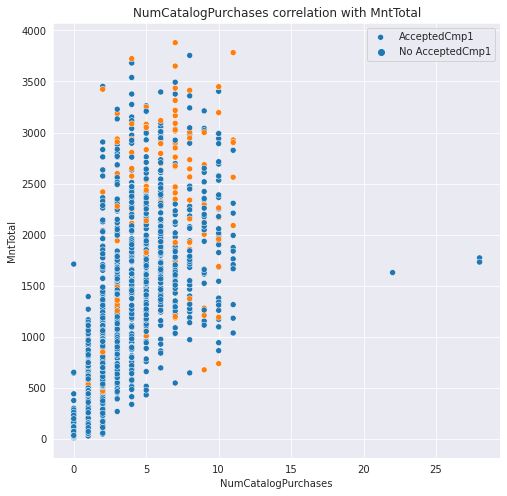

Correlation Coefficient %: 0.75
-----------------------------------------------------------


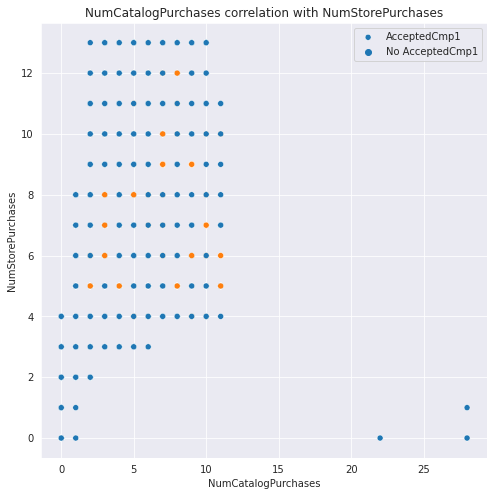

Correlation Coefficient %: 0.52
-----------------------------------------------------------


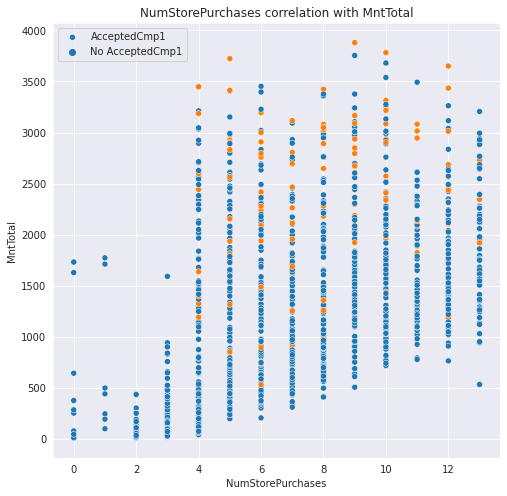

Correlation Coefficient %: 0.68
-----------------------------------------------------------


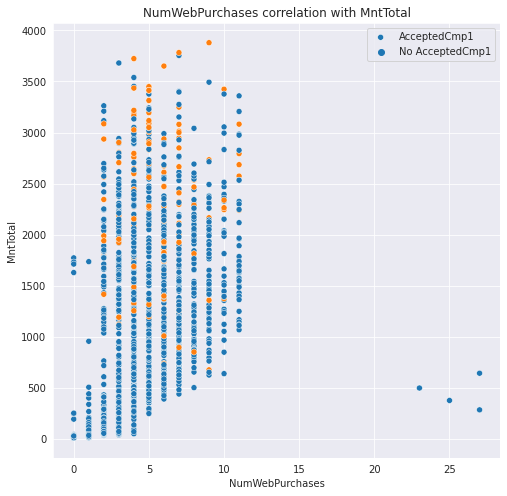

Correlation Coefficient %: 0.54
-----------------------------------------------------------


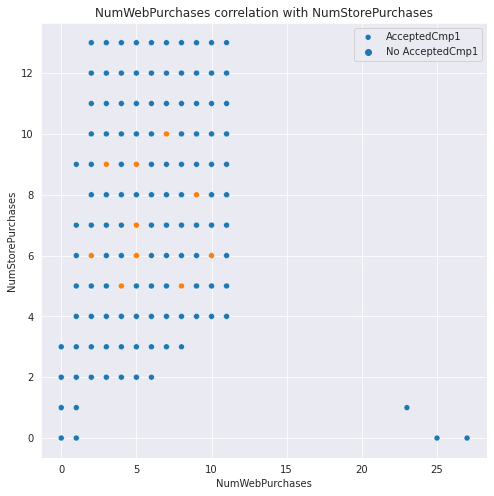

Correlation Coefficient %: 0.5
-----------------------------------------------------------


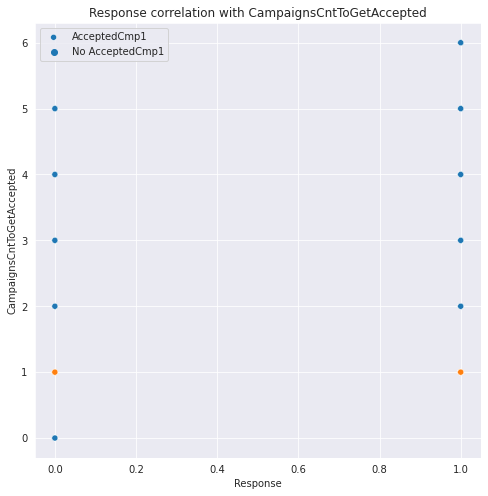

Correlation Coefficient %: 0.68
-----------------------------------------------------------


In [20]:
corr_features = [['AcceptedCmp1', 'Num_Accepted'], ['Income', 'MntMeatProducts'], ['Income', 'MntTotal'], ['Income', 'MntWines'], ['Income', 'NumCatalogPurchases'], ['Income', 'NumStorePurchases'], ['MntFishProducts', 'MntSweetProducts'], ['MntFishProducts', 'MntTotal'], ['MntFishProducts', 'NumCatalogPurchases'], ['MntFruits', 'MntFishProducts'], ['MntFruits', 'MntMeatProducts'], ['MntFruits', 'MntSweetProducts'], ['MntFruits', 'MntTotal'], ['MntMeatProducts', 'MntFishProducts'], ['MntMeatProducts', 'MntSweetProducts'], ['MntMeatProducts', 'MntTotal'], ['MntMeatProducts', 'NumCatalogPurchases'], ['MntSweetProducts', 'MntTotal'], ['MntWines', 'MntMeatProducts'], ['MntWines', 'MntTotal'], ['MntWines', 'NumCatalogPurchases'], ['MntWines', 'NumStorePurchases'], ['MntWines', 'NumWebPurchases'], ['MntWines', 'Num_Accepted'], ['NumCatalogPurchases', 'MntTotal'], ['NumCatalogPurchases', 'NumStorePurchases'], ['NumStorePurchases', 'MntTotal'], ['NumWebPurchases', 'MntTotal'], ['NumWebPurchases', 'NumStorePurchases'], ['Response', 'CampaignsCntToGetAccepted']]
corr_mx = customer_data.corr()

for corr in corr_features:
    display_scatterplot(customer_data, corr[0], corr[1])
    print('Correlation Coefficient %:', round((corr_mx.loc[corr[0], corr[1]]), 2))
    print('-----------------------------------------------------------')

In [21]:
#Let's remove outliers from the columns 'Income'
customer_data=customer_data.drop(customer_data[customer_data['Income']>600000].index)

#removing outliers from the column 'Age'
customer_data=customer_data.drop(customer_data[customer_data['Age']>120].index)

In [22]:
X, y = customer_data.drop('AcceptedCmp1', axis=1).values, customer_data['AcceptedCmp1'].values

In [23]:
ct = ColumnTransformer([
    ('categoric', OneHotEncoder(), [0]),
    ('numeric', StandardScaler(), list(range(1, len(X.T))))
])

X_transformed = ct.fit_transform(X)


In [24]:
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.3, random_state=108)

X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=108)

print('Length of Each Dataset:')
print('Training Set:', len(X_train))
print('Validation Set:', len(X_val))
print('Test Set:', len(X_test))

Length of Each Dataset:
Training Set: 1565
Validation Set: 335
Test Set: 336


In [25]:
sm = SMOTE(random_state=8)

X_bal, y_bal = sm.fit_resample(X_train, y_train)

print('Initial Training Set')
print('Percent "Responded to Cmp1":', y_train.sum()/len(y_train))
print('Balanced Training Set')
print('Percent "Responded Cmp1":', y_bal.sum()/len(y_bal))

Initial Training Set
Percent "Responded to Cmp1": 0.065814696485623
Balanced Training Set
Percent "Responded Cmp1": 0.5


Recall as having more False Positives is fine (customers who will not respond to the marketing but was targeted anyway) than False Negatives (customers who would have responded to the add but were not targeted)

In [26]:
# Logistic regression
lr_params = {'solver': ['liblinear'], 'penalty': ['l1'], 'C': [1.0, 0.5, 0.25]}

lr_grid = GridSearchCV(LogisticRegression(), lr_params, cv=3, scoring='recall')

lr_grid.fit(X_bal, y_bal)

lr = lr_grid.best_estimator_

print('Best Parameters:', lr_grid.best_params_)

lr_preds = lr.predict(X_val)
lr_val_acc = accuracy_score(y_val, lr_preds)
lr_val_rec = recall_score(y_val, lr_preds)
print('Logistic Regression Model Accuracy:', lr_val_acc)
print('Logistic Regression Model Recall:', lr_val_rec)

Best Parameters: {'C': 1.0, 'penalty': 'l1', 'solver': 'liblinear'}
Logistic Regression Model Accuracy: 0.991044776119403
Logistic Regression Model Recall: 0.9583333333333334


In [27]:
#SVM
svm_params = {'kernel': ['poly', 'rbf'], 'C': [1.0, 0.5, 0.25], 'gamma': ['scale', 'auto']}

svm_grid = GridSearchCV(SVC(), svm_params, cv=3, scoring='recall')

svm_grid.fit(X_bal, y_bal)


svm = svm_grid.best_estimator_

print('Best Parameters:', svm_grid.best_params_)

svm_preds = svm.predict(X_val)
svm_val_acc = accuracy_score(y_val, svm_preds)
svm_val_rec = recall_score(y_val, svm_preds)
print('Support Vector Machine Accuracy:', svm_val_acc)
print('Support Vector Machine Recall:', svm_val_rec)

Best Parameters: {'C': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
Support Vector Machine Accuracy: 0.9940298507462687
Support Vector Machine Recall: 0.9583333333333334


In [28]:
#KNN

knn_params = {'n_neighbors': [7, 9, 11], 'algorithm': ['ball_tree', 'kd_tree', 'brute'],
             'weights': ['uniform', 'distance']}

knn_grid = GridSearchCV(KNeighborsClassifier(), knn_params, cv=3, scoring='recall')


knn_grid.fit(X_bal, y_bal)


knn = knn_grid.best_estimator_


print('Best Parameters:', knn_grid.best_params_)

knn_preds = knn.predict(X_val)
knn_val_acc = accuracy_score(y_val, knn_preds)
knn_val_rec = recall_score(y_val, knn_preds)
print('K Nearest Neighbors Accuracy:', knn_val_acc)
print('K Nearest Neighbors Recall:', knn_val_rec)

Best Parameters: {'algorithm': 'ball_tree', 'n_neighbors': 7, 'weights': 'uniform'}
K Nearest Neighbors Accuracy: 0.9253731343283582
K Nearest Neighbors Recall: 0.9583333333333334


In [29]:
# Naive Bayes
nb = GaussianNB()

nb.fit(X_bal, y_bal)

nb_preds = nb.predict(X_val)
nb_val_acc = accuracy_score(y_val, nb_preds)
nb_val_rec = recall_score(y_val, nb_preds)
print('Naive Bayes Accuracy:', nb_val_acc)
print('Naive Bayes Machine Recall:', nb_val_rec)

Naive Bayes Accuracy: 1.0
Naive Bayes Machine Recall: 1.0


In [30]:
#Gradient Boosting
xgb_params = {'n_estimators': [240, 250, 260], 'max_depth': [15, 16, 17],
             'colsample_bytree': [0.6, 0.7, 0.8, 1.0]}


xgb_grid = GridSearchCV(XGBClassifier(use_label_encoder=False, verbosity=0), xgb_params, cv=3, 
                        scoring='recall')


xgb_grid.fit(X_bal, y_bal)


xgb = xgb_grid.best_estimator_


print('Best Parameters:', xgb_grid.best_params_)


xgb_preds = xgb.predict(X_val)
xgb_val_acc = accuracy_score(y_val, xgb_preds)
xgb_val_rec = recall_score(y_val, xgb_preds)
print('Gradient Boosting Tree Accuracy:', xgb_val_acc)
print('Gradient Boosting Tree Recall:', xgb_val_rec)

Best Parameters: {'colsample_bytree': 0.6, 'max_depth': 15, 'n_estimators': 240}
Gradient Boosting Tree Accuracy: 1.0
Gradient Boosting Tree Recall: 1.0


In [31]:
# Ensemble
models = [('logistic_regression', lr), ('support vector machine', svm), 
        ('knn', knn), ('naive_bayes', nb), ('gradient_boost', xgb)]

#Combine models
ensemble_model = VotingClassifier(estimators=models)

#fit the model on the training set
ensemble_model.fit(X_bal, y_bal)

#Display the metrics for the validation set
ensemble_preds = ensemble_model.predict(X_val)
ensemble_val_acc = accuracy_score(y_val, ensemble_preds)
ensemble_val_rec = recall_score(y_val, ensemble_preds)
print('Ensemble Model Accuracy:', ensemble_val_acc)
print('Ensemble Model Recall:', ensemble_val_rec)

Ensemble Model Accuracy: 0.9970149253731343
Ensemble Model Recall: 1.0


In [32]:
test_preds = ensemble_model.predict(X_test)
test_acc = accuracy_score(y_test, test_preds)
test_rec = recall_score(y_test, test_preds)
print('Test Set Metrics')
print('Ensemble Model Accuracy:', test_acc)
print('Ensemble Model Recall:', test_rec)

Test Set Metrics
Ensemble Model Accuracy: 0.9970238095238095
Ensemble Model Recall: 0.9411764705882353


In [33]:
#Bonus

In [34]:
X, y = customer_data.drop('CampaignsCntToGetAccepted', axis=1).values, customer_data['CampaignsCntToGetAccepted'].values

In [35]:
ct = ColumnTransformer([
    ('categoric', OneHotEncoder(), [0]),
    ('numeric', StandardScaler(), list(range(1, len(X.T))))
])

X_transformed = ct.fit_transform(X)


In [36]:
X_train, X_test, y_train, y_test = train_test_split(X_transformed, y, test_size=0.3, random_state=108)

X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=108)

print('Length of Each Dataset:')
print('Training Set:', len(X_train))
print('Validation Set:', len(X_val))
print('Test Set:', len(X_test))

Length of Each Dataset:
Training Set: 1565
Validation Set: 335
Test Set: 336


In [37]:
X_bal, y_bal = X_train, y_train

In [38]:
# Linear regression
lr = LinearRegression()
lr.fit(X_bal, y_bal)

lr_preds = lr.predict(X_val)

lr_val_mse = mean_squared_error(y_val, lr_preds)
lr_val_r2 = r2_score(y_val, lr_preds)
print('Linear Regression Model MSE:', lr_val_mse)
print('Linear Regression Model R2:', lr_val_r2)

Linear Regression Model MSE: 1.4625169896367771
Linear Regression Model R2: 0.5906815470814759


In [39]:
#SVR
svm_params = {'kernel': ['poly', 'rbf'], 'C': [1.0, 0.5, 0.25], 'gamma': ['scale', 'auto']}

svm_grid = GridSearchCV(SVR(), svm_params, cv=3, scoring='r2')

svm_grid.fit(X_bal, y_bal)

svm = svm_grid.best_estimator_

print('Best Parameters:', svm_grid.best_params_)

svm_preds = svm.predict(X_val)
lr_val_mse = mean_squared_error(y_val, svm_preds)
lr_val_r2 = r2_score(y_val, svm_preds)
print('SVR Model MSE:', lr_val_mse)
print('SVR Regression Model R2:', lr_val_r2)

Best Parameters: {'C': 1.0, 'gamma': 'scale', 'kernel': 'rbf'}
SVR Model MSE: 0.41203385267256215
SVR Regression Model R2: 0.8846830085933716


In [40]:
#KNN

knn_params = {'n_neighbors': [15, 13, 2, 3, 5, 21, 7, 9, 11], 'algorithm': ['ball_tree', 'kd_tree', 'brute'],
             'weights': ['uniform', 'distance']}

knn_grid = GridSearchCV(KNeighborsRegressor(), knn_params, cv=3, scoring='r2')


knn_grid.fit(X_bal, y_bal)


knn = knn_grid.best_estimator_


print('Best Parameters:', knn_grid.best_params_)

knn_preds = knn.predict(X_val)
lr_val_mse = mean_squared_error(y_val, knn_preds)
lr_val_r2 = r2_score(y_val, knn_preds)
print('KNN Model MSE:', lr_val_mse)
print('KNN Regression Model R2:', lr_val_r2)

Best Parameters: {'algorithm': 'ball_tree', 'n_neighbors': 3, 'weights': 'distance'}
KNN Model MSE: 0.5898250352317439
KNN Regression Model R2: 0.8349241255832311


In [41]:
#Gradient Boosting
xgb_params = {'n_estimators': [240, 250, 260], 'max_depth': [15, 16, 17],
             'colsample_bytree': [0.6, 0.7, 0.8, 1.0]}


xgb_grid = GridSearchCV(XGBRegressor(use_label_encoder=False, verbosity=0), xgb_params, cv=3, 
                        scoring='r2')


xgb_grid.fit(X_bal, y_bal)


xgb = xgb_grid.best_estimator_


print('Best Parameters:', xgb_grid.best_params_)


xgb_preds = xgb.predict(X_val)
lr_val_mse = mean_squared_error(y_val, xgb_preds)
lr_val_r2 = r2_score(y_val, xgb_preds)
print('Gradient boosting Model MSE:', lr_val_mse)
print('Gradient boosting Regression Model R2:', lr_val_r2)

Best Parameters: {'colsample_bytree': 1.0, 'max_depth': 15, 'n_estimators': 240}
Gradient boosting Model MSE: 0.044298540429403795
Gradient boosting Regression Model R2: 0.9876020516933512


In [42]:
#Gradient Boosting Random Forest
xgb_params = {'n_estimators': [240, 250, 260], 'max_depth': [15, 16, 17],
             'colsample_bytree': [0.6, 0.7, 0.8, 1.0]}


xgb_grid = GridSearchCV(XGBRFRegressor(use_label_encoder=False, verbosity=0), xgb_params, cv=3, 
                        scoring='r2')


xgb_grid.fit(X_bal, y_bal)


xgbrf = xgb_grid.best_estimator_


print('Best Parameters:', xgb_grid.best_params_)


xgb_preds = xgbrf.predict(X_val)
lr_val_mse = mean_squared_error(y_val, xgb_preds)
lr_val_r2 = r2_score(y_val, xgb_preds)
print('Gradient boosting RF Model MSE:', lr_val_mse)
print('Gradient boosting RF Regression Model R2:', lr_val_r2)

Best Parameters: {'colsample_bytree': 1.0, 'max_depth': 15, 'n_estimators': 240}
Gradient boosting RF Model MSE: 0.05818287522762275
Gradient boosting RF Regression Model R2: 0.9837162066196327


In [43]:
# Ensemble
models = [('logistic_regression', lr), ('support vector machine', svm), 
        ('knn', knn), ('gradient_boost_regressor', xgbrf), ('gradient_boost', xgb)]

#Combine models
ensemble_model = VotingRegressor(estimators=models)

#fit the model on the training set
ensemble_model.fit(X_bal, y_bal)

#Display the metrics for the validation set
ensemble_preds = ensemble_model.predict(X_val)
lr_val_mse = mean_squared_error(y_val, ensemble_preds)
lr_val_r2 = r2_score(y_val, ensemble_preds)
print('Ensemble Model MSE:', lr_val_mse)
print('Ensemble Regression Model R2:', lr_val_r2)

Ensemble Model MSE: 0.23314525324485064
Ensemble Regression Model R2: 0.9347490285311623


In [44]:
test_preds = ensemble_model.predict(X_test)
lr_val_mse = mean_squared_error(y_test, test_preds)
lr_val_r2 = r2_score(y_test, test_preds)

print('Test Set Metrics')
print('Ensemble Model MSE:', lr_val_mse)
print('Ensemble Model R2:', lr_val_r2)

Test Set Metrics
Ensemble Model MSE: 0.2424803173932371
Ensemble Model R2: 0.9243262412199914
